# 0. Importing libraries and defining functions


In [1]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Geospatial libraries
import folium

# Importing utils
from custom_functions import (
    read_file,
    haversine_distance,
    remove_outliers,
    optimal_clusters_sse,
    get_customer_types,
)

# settings to display all columns and rows
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Warnings
import warnings

np.seterr(divide='ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=DeprecationWarning)

plt.rcParams.update({
    # Use LaTeX default serif font-family.
    # https://matplotlib.org/stable/tutorials/text/usetex.html#sphx-glr-tutorials-text-usetex-py
    'font.family': 'serif',
    # Use specific cursive fonts.
    'font.cursive': ['Comic Neue', 'Comic Sans MS'],
})
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=DeprecationWarning)
warnings.simplefilter(action='ignore', category=RuntimeWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

warnings.filterwarnings('ignore')

# 1. Reading data


In [2]:
venues_info = pd.read_csv('../data/venues_info.csv')
venues_info['place'] = venues_info['venue_address'].apply(
    lambda x: x.split(' ')[1:].pop(0).lower())
venues_info

,#,venue_name,venue_address,venue_lat,venue_long,notes,place
0,1,Planet Fitness,"10790 Alpharetta Hwy, Roswell, GA 30076, Roswe...",34.042468,-84.342179,underperfoming,alpharetta
1,2,Planet Fitness,"1570 Holcomb Bridge Road, Roswell, Georgia, Un...",34.018754,-84.311867,NaN,holcomb
2,3,Planet Fitness,"13071 Highway 9, Milton, GA, United States",34.101378,-84.268668,NaN,highway
3,4,Planet Fitness,"299 Molly Lane, Woodstock, GA, United States",34.083409,-84.538985,NaN,molly


In [3]:
# Reading all files and adding them to a list
files = [
    f'../data/{file}' for file in os.listdir('../data')
    if file != 'venues_info.csv'
]
dfs = []
for file in files:
    dfs.append(read_file(file))

# Concatenating all dataframes
data = pd.concat(dfs, ignore_index=True)

# Merge the dataframes with venues_info
data = pd.merge(data, venues_info, on='place', how='left')

# Replacing nan for 'well_performing' for 'notes'
data['notes'].fillna('well_performing', inplace=True)

# Drop the columns that are not needed
data.drop(['venue_id', '#', 'venue_address', 'venue_name'],
          axis=1,
          inplace=True)

# Sorting data
data.sort_values(by=['device_id', 'visit_id'], inplace=True)

data.head(10)


,device_id,visit_id,visit_start_time,visit_end_time,visit_lat,visit_long,visit_weight,customer_weight,user_home_lat,user_home_long,user_work_lat,user_work_long,place,venue_lat,venue_long,notes
20610,56da04f0ff02115e0730d497,5a7cd5e2a5a78f05a270cf0a,2018-02-08 17:40:00,2018-02-08 18:05:00,34.084049,-84.539081,20.945921,0.0,34.241127,-84.319103,34.208045,-84.507132,molly,34.083409,-84.538985,well_performing
23392,572a79e1a5a78f30413fd697,5ac9777d2e1790080d742364,2018-04-07 21:35:00,2018-04-07 22:01:00,34.083838,-84.538970,43.080536,0.0,33.320257,-111.901238,33.633721,-111.912656,molly,34.083409,-84.538985,well_performing
23393,572a79e1a5a78f30413fd697,5ad129d41b0fa00823f92721,2018-04-13 17:55:00,2018-04-13 18:20:00,34.083843,-84.538926,42.057503,0.0,33.321928,-111.903713,33.634357,-111.912131,molly,34.083409,-84.538985,well_performing
23394,572a79e1a5a78f30413fd697,5ad77ceb0c51ce0794869c82,2018-04-18 13:03:00,2018-04-18 14:21:00,34.083833,-84.539064,42.361259,0.0,33.320872,-111.903646,33.634861,-111.912035,molly,34.083409,-84.538985,well_performing
13530,577dec9fa5a78f62af1fdff0,5a89f990ff02114235fce665,2018-02-18 17:00:00,2018-02-18 17:47:00,34.018486,-84.312263,38.842709,0.0,34.013697,-84.299545,34.023039,-84.287323,holcomb,34.018754,-84.311867,well_performing
13531,577dec9fa5a78f62af1fdff0,5a9b2311ff02116bf91fc0ea,2018-03-03 17:25:00,2018-03-03 18:15:00,34.018684,-84.312218,37.111748,0.0,34.012096,-84.296538,34.021654,-84.287967,holcomb,34.018754,-84.311867,well_performing
13532,577dec9fa5a78f62af1fdff0,5ab041b0c4fff5082921ab1d,2018-03-19 18:54:00,2018-03-19 19:47:00,34.018562,-84.312073,36.568333,0.0,34.012422,-84.296933,34.021243,-84.285257,holcomb,34.018754,-84.311867,well_performing
13533,577dec9fa5a78f62af1fdff0,5afa150b196d600836a7e567,2018-05-14 18:48:00,2018-05-14 20:03:00,34.018707,-84.312248,35.220734,0.0,34.014151,-84.297118,34.023214,-84.286283,holcomb,34.018754,-84.311867,well_performing
13534,577dec9fa5a78f62af1fdff0,5afc15dfc0af75086cae495c,2018-05-16 07:19:00,2018-05-16 08:09:00,34.018669,-84.312065,34.983936,0.0,34.013898,-84.296366,34.021182,-84.287179,holcomb,34.018754,-84.311867,well_performing
2115,57f303a51ae60d5025314b0c,5ae61b59c018d2085b50efe5,2018-04-29 15:12:00,2018-04-29 16:00:00,34.042122,-84.341560,18.059432,0.0,34.057940,-84.487760,NaN,NaN,alpharetta,34.042468,-84.342179,underperfoming


In [4]:
print('\n####################\n Data Info \n#################### \n')
display(data.info())
print('\n####################\n Data Description \n#################### \n')
display(data.describe(include='all'))
print('\n####################\n Data Head \n#################### \n')
display(data.head(10))


####################
 Data Info 
#################### 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29725 entries, 20610 to 3650
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   device_id         29725 non-null  object 
 1   visit_id          29725 non-null  object 
 2   visit_start_time  29725 non-null  object 
 3   visit_end_time    29725 non-null  object 
 4   visit_lat         29725 non-null  float64
 5   visit_long        29725 non-null  float64
 6   visit_weight      29725 non-null  float64
 7   customer_weight   29725 non-null  float64
 8   user_home_lat     29725 non-null  float64
 9   user_home_long    29725 non-null  float64
 10  user_work_lat     23963 non-null  float64
 11  user_work_long    23963 non-null  float64
 12  place             29725 non-null  object 
 13  venue_lat         29725 non-null  float64
 14  venue_long        29725 non-null  float64
 15  notes             29725 non

None


####################
 Data Description 
#################### 



,device_id,visit_id,visit_start_time,visit_end_time,visit_lat,visit_long,visit_weight,customer_weight,user_home_lat,user_home_long,user_work_lat,user_work_long,place,venue_lat,venue_long,notes
count,29725,29725,29725,29725,29725.000000,29725.000000,29725.000000,29725.000000,29725.000000,29725.000000,23963.000000,23963.000000,29725,29725.000000,29725.000000,29725
unique,5098,29725,27865,27878,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,NaN,2
top,59ccc4276cffe57aaba896fc,5a7cd5e2a5a78f05a270cf0a,2019-01-27 13:45:00,2018-06-07 21:01:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,molly,NaN,NaN,well_performing
freq,234,1,5,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11757,NaN,NaN,25060
mean,NaN,NaN,NaN,NaN,34.067571,-84.396360,27.513926,22.573872,34.088130,-84.430855,34.048063,-84.389183,NaN,34.067478,-84.396296,NaN
std,NaN,NaN,NaN,NaN,0.031249,0.117723,15.343033,45.498377,0.892624,1.858309,0.768386,1.479342,NaN,0.031193,0.117717,NaN
min,NaN,NaN,NaN,NaN,34.018082,-84.540092,0.000000,0.000000,21.276465,-157.826750,25.703155,-122.753674,NaN,34.018754,-84.538985,NaN
25%,NaN,NaN,NaN,NaN,34.042462,-84.539055,19.380766,0.000000,34.027702,-84.531605,33.941079,-84.487990,NaN,34.042468,-84.538985,NaN
50%,NaN,NaN,NaN,NaN,34.083610,-84.341764,24.296464,0.000000,34.086052,-84.353795,34.046017,-84.353440,NaN,34.083409,-84.342179,NaN
75%,NaN,NaN,NaN,NaN,34.083893,-84.311340,31.895121,55.933695,34.123195,-84.272276,34.096989,-84.275777,NaN,34.083409,-84.311867,NaN



####################
 Data Head 
#################### 



,device_id,visit_id,visit_start_time,visit_end_time,visit_lat,visit_long,visit_weight,customer_weight,user_home_lat,user_home_long,user_work_lat,user_work_long,place,venue_lat,venue_long,notes
20610,56da04f0ff02115e0730d497,5a7cd5e2a5a78f05a270cf0a,2018-02-08 17:40:00,2018-02-08 18:05:00,34.084049,-84.539081,20.945921,0.0,34.241127,-84.319103,34.208045,-84.507132,molly,34.083409,-84.538985,well_performing
23392,572a79e1a5a78f30413fd697,5ac9777d2e1790080d742364,2018-04-07 21:35:00,2018-04-07 22:01:00,34.083838,-84.538970,43.080536,0.0,33.320257,-111.901238,33.633721,-111.912656,molly,34.083409,-84.538985,well_performing
23393,572a79e1a5a78f30413fd697,5ad129d41b0fa00823f92721,2018-04-13 17:55:00,2018-04-13 18:20:00,34.083843,-84.538926,42.057503,0.0,33.321928,-111.903713,33.634357,-111.912131,molly,34.083409,-84.538985,well_performing
23394,572a79e1a5a78f30413fd697,5ad77ceb0c51ce0794869c82,2018-04-18 13:03:00,2018-04-18 14:21:00,34.083833,-84.539064,42.361259,0.0,33.320872,-111.903646,33.634861,-111.912035,molly,34.083409,-84.538985,well_performing
13530,577dec9fa5a78f62af1fdff0,5a89f990ff02114235fce665,2018-02-18 17:00:00,2018-02-18 17:47:00,34.018486,-84.312263,38.842709,0.0,34.013697,-84.299545,34.023039,-84.287323,holcomb,34.018754,-84.311867,well_performing
13531,577dec9fa5a78f62af1fdff0,5a9b2311ff02116bf91fc0ea,2018-03-03 17:25:00,2018-03-03 18:15:00,34.018684,-84.312218,37.111748,0.0,34.012096,-84.296538,34.021654,-84.287967,holcomb,34.018754,-84.311867,well_performing
13532,577dec9fa5a78f62af1fdff0,5ab041b0c4fff5082921ab1d,2018-03-19 18:54:00,2018-03-19 19:47:00,34.018562,-84.312073,36.568333,0.0,34.012422,-84.296933,34.021243,-84.285257,holcomb,34.018754,-84.311867,well_performing
13533,577dec9fa5a78f62af1fdff0,5afa150b196d600836a7e567,2018-05-14 18:48:00,2018-05-14 20:03:00,34.018707,-84.312248,35.220734,0.0,34.014151,-84.297118,34.023214,-84.286283,holcomb,34.018754,-84.311867,well_performing
13534,577dec9fa5a78f62af1fdff0,5afc15dfc0af75086cae495c,2018-05-16 07:19:00,2018-05-16 08:09:00,34.018669,-84.312065,34.983936,0.0,34.013898,-84.296366,34.021182,-84.287179,holcomb,34.018754,-84.311867,well_performing
2115,57f303a51ae60d5025314b0c,5ae61b59c018d2085b50efe5,2018-04-29 15:12:00,2018-04-29 16:00:00,34.042122,-84.341560,18.059432,0.0,34.057940,-84.487760,NaN,NaN,alpharetta,34.042468,-84.342179,underperfoming


In [5]:
data.describe(include='all')

,device_id,visit_id,visit_start_time,visit_end_time,visit_lat,visit_long,visit_weight,customer_weight,user_home_lat,user_home_long,user_work_lat,user_work_long,place,venue_lat,venue_long,notes
count,29725,29725,29725,29725,29725.000000,29725.000000,29725.000000,29725.000000,29725.000000,29725.000000,23963.000000,23963.000000,29725,29725.000000,29725.000000,29725
unique,5098,29725,27865,27878,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,NaN,2
top,59ccc4276cffe57aaba896fc,5a7cd5e2a5a78f05a270cf0a,2019-01-27 13:45:00,2018-06-07 21:01:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,molly,NaN,NaN,well_performing
freq,234,1,5,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11757,NaN,NaN,25060
mean,NaN,NaN,NaN,NaN,34.067571,-84.396360,27.513926,22.573872,34.088130,-84.430855,34.048063,-84.389183,NaN,34.067478,-84.396296,NaN
std,NaN,NaN,NaN,NaN,0.031249,0.117723,15.343033,45.498377,0.892624,1.858309,0.768386,1.479342,NaN,0.031193,0.117717,NaN
min,NaN,NaN,NaN,NaN,34.018082,-84.540092,0.000000,0.000000,21.276465,-157.826750,25.703155,-122.753674,NaN,34.018754,-84.538985,NaN
25%,NaN,NaN,NaN,NaN,34.042462,-84.539055,19.380766,0.000000,34.027702,-84.531605,33.941079,-84.487990,NaN,34.042468,-84.538985,NaN
50%,NaN,NaN,NaN,NaN,34.083610,-84.341764,24.296464,0.000000,34.086052,-84.353795,34.046017,-84.353440,NaN,34.083409,-84.342179,NaN
75%,NaN,NaN,NaN,NaN,34.083893,-84.311340,31.895121,55.933695,34.123195,-84.272276,34.096989,-84.275777,NaN,34.083409,-84.311867,NaN


# 2. Feature engineering and data cleaning


## 2.1. Creating new features


In [6]:
# Creating new features

# Date
data['start_date'] = pd.to_datetime(data['visit_start_time']).dt.date

# time in place in seconds
data['time_in_place_minutes'] = pd.to_datetime(
    data['visit_end_time']) - pd.to_datetime(data['visit_start_time'])
data['time_in_place_minutes'] = data['time_in_place_minutes'].dt.total_seconds(
) / 60

# Day of the week
data['day_of_week'] = pd.to_datetime(data['visit_start_time']).dt.day_name()

# Weekend
data['weekend'] = data['day_of_week'].apply(
    lambda x: 1 if x in ['Saturday', 'Sunday'] else 0)

# Month of the year
data['month'] = pd.to_datetime(data['visit_start_time']).dt.month_name()

# Hour of the day
data['visit_hour'] = pd.to_datetime(data['visit_start_time']).dt.hour

# Distances from home and work in miles
data['distance_from_home_miles'] = haversine_distance(data['venue_lat'],
                                                      data['venue_long'],
                                                      data['user_home_lat'],
                                                      data['user_home_long'])

data['distance_from_work_miles'] = haversine_distance(data['venue_lat'],
                                                      data['venue_long'],
                                                      data['user_work_lat'],
                                                      data['user_work_long'])

data.head(10)

,device_id,visit_id,visit_start_time,visit_end_time,visit_lat,visit_long,visit_weight,customer_weight,user_home_lat,user_home_long,user_work_lat,user_work_long,place,venue_lat,venue_long,notes,start_date,time_in_place_minutes,day_of_week,weekend,month,visit_hour,distance_from_home_miles,distance_from_work_miles
20610,56da04f0ff02115e0730d497,5a7cd5e2a5a78f05a270cf0a,2018-02-08 17:40:00,2018-02-08 18:05:00,34.084049,-84.539081,20.945921,0.0,34.241127,-84.319103,34.208045,-84.507132,molly,34.083409,-84.538985,well_performing,2018-02-08,25.0,Thursday,0,February,17,16.64,8.80
23392,572a79e1a5a78f30413fd697,5ac9777d2e1790080d742364,2018-04-07 21:35:00,2018-04-07 22:01:00,34.083838,-84.538970,43.080536,0.0,33.320257,-111.901238,33.633721,-111.912656,molly,34.083409,-84.538985,well_performing,2018-04-07,26.0,Saturday,1,April,21,1569.45,1566.63
23393,572a79e1a5a78f30413fd697,5ad129d41b0fa00823f92721,2018-04-13 17:55:00,2018-04-13 18:20:00,34.083843,-84.538926,42.057503,0.0,33.321928,-111.903713,33.634357,-111.912131,molly,34.083409,-84.538985,well_performing,2018-04-13,25.0,Friday,0,April,17,1569.57,1566.59
23394,572a79e1a5a78f30413fd697,5ad77ceb0c51ce0794869c82,2018-04-18 13:03:00,2018-04-18 14:21:00,34.083833,-84.539064,42.361259,0.0,33.320872,-111.903646,33.634861,-111.912035,molly,34.083409,-84.538985,well_performing,2018-04-18,78.0,Wednesday,0,April,13,1569.58,1566.58
13530,577dec9fa5a78f62af1fdff0,5a89f990ff02114235fce665,2018-02-18 17:00:00,2018-02-18 17:47:00,34.018486,-84.312263,38.842709,0.0,34.013697,-84.299545,34.023039,-84.287323,holcomb,34.018754,-84.311867,well_performing,2018-02-18,47.0,Sunday,1,February,17,0.79,1.44
13531,577dec9fa5a78f62af1fdff0,5a9b2311ff02116bf91fc0ea,2018-03-03 17:25:00,2018-03-03 18:15:00,34.018684,-84.312218,37.111748,0.0,34.012096,-84.296538,34.021654,-84.287967,holcomb,34.018754,-84.311867,well_performing,2018-03-03,50.0,Saturday,1,March,17,0.99,1.38
13532,577dec9fa5a78f62af1fdff0,5ab041b0c4fff5082921ab1d,2018-03-19 18:54:00,2018-03-19 19:47:00,34.018562,-84.312073,36.568333,0.0,34.012422,-84.296933,34.021243,-84.285257,holcomb,34.018754,-84.311867,well_performing,2018-03-19,53.0,Monday,0,March,18,0.96,1.53
13533,577dec9fa5a78f62af1fdff0,5afa150b196d600836a7e567,2018-05-14 18:48:00,2018-05-14 20:03:00,34.018707,-84.312248,35.220734,0.0,34.014151,-84.297118,34.023214,-84.286283,holcomb,34.018754,-84.311867,well_performing,2018-05-14,75.0,Monday,0,May,18,0.90,1.50
13534,577dec9fa5a78f62af1fdff0,5afc15dfc0af75086cae495c,2018-05-16 07:19:00,2018-05-16 08:09:00,34.018669,-84.312065,34.983936,0.0,34.013898,-84.296366,34.021182,-84.287179,holcomb,34.018754,-84.311867,well_performing,2018-05-16,50.0,Wednesday,0,May,7,0.95,1.42
2115,57f303a51ae60d5025314b0c,5ae61b59c018d2085b50efe5,2018-04-29 15:12:00,2018-04-29 16:00:00,34.042122,-84.341560,18.059432,0.0,34.057940,-84.487760,NaN,NaN,alpharetta,34.042468,-84.342179,underperfoming,2018-04-29,48.0,Sunday,1,April,15,8.40,NaN


## 2.2. Data cleaning


In [7]:
data.describe(include='all')

,device_id,visit_id,visit_start_time,visit_end_time,visit_lat,visit_long,visit_weight,customer_weight,user_home_lat,user_home_long,user_work_lat,user_work_long,place,venue_lat,venue_long,notes,start_date,time_in_place_minutes,day_of_week,weekend,month,visit_hour,distance_from_home_miles,distance_from_work_miles
count,29725,29725,29725,29725,29725.000000,29725.000000,29725.000000,29725.000000,29725.000000,29725.000000,23963.000000,23963.000000,29725,29725.000000,29725.000000,29725,29725,29725.000000,29725,29725.000000,29725,29725.000000,29725.000000,23963.000000
unique,5098,29725,27865,27878,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,NaN,2,364,NaN,7,NaN,12,NaN,NaN,NaN
top,59ccc4276cffe57aaba896fc,5a7cd5e2a5a78f05a270cf0a,2019-01-27 13:45:00,2018-06-07 21:01:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,molly,NaN,NaN,well_performing,2019-01-15,NaN,Tuesday,NaN,January,NaN,NaN,NaN
freq,234,1,5,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11757,NaN,NaN,25060,141,NaN,5328,NaN,3212,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,34.067571,-84.396360,27.513926,22.573872,34.088130,-84.430855,34.048063,-84.389183,NaN,34.067478,-84.396296,NaN,NaN,71.857325,NaN,0.176047,NaN,12.889891,23.420194,22.270890
std,NaN,NaN,NaN,NaN,0.031249,0.117723,15.343033,45.498377,0.892624,1.858309,0.768386,1.479342,NaN,0.031193,0.117717,NaN,NaN,44.850127,NaN,0.380867,NaN,5.040472,118.758590,95.479651
min,NaN,NaN,NaN,NaN,34.018082,-84.540092,0.000000,0.000000,21.276465,-157.826750,25.703155,-122.753674,NaN,34.018754,-84.538985,NaN,NaN,5.000000,NaN,0.000000,NaN,0.000000,0.030000,0.010000
25%,NaN,NaN,NaN,NaN,34.042462,-84.539055,19.380766,0.000000,34.027702,-84.531605,33.941079,-84.487990,NaN,34.042468,-84.538985,NaN,NaN,49.000000,NaN,0.000000,NaN,8.000000,1.720000,2.310000
50%,NaN,NaN,NaN,NaN,34.083610,-84.341764,24.296464,0.000000,34.086052,-84.353795,34.046017,-84.353440,NaN,34.083409,-84.342179,NaN,NaN,66.000000,NaN,0.000000,NaN,13.000000,3.440000,6.140000
75%,NaN,NaN,NaN,NaN,34.083893,-84.311340,31.895121,55.933695,34.123195,-84.272276,34.096989,-84.275777,NaN,34.083409,-84.311867,NaN,NaN,86.000000,NaN,0.000000,NaN,17.000000,8.060000,14.100000


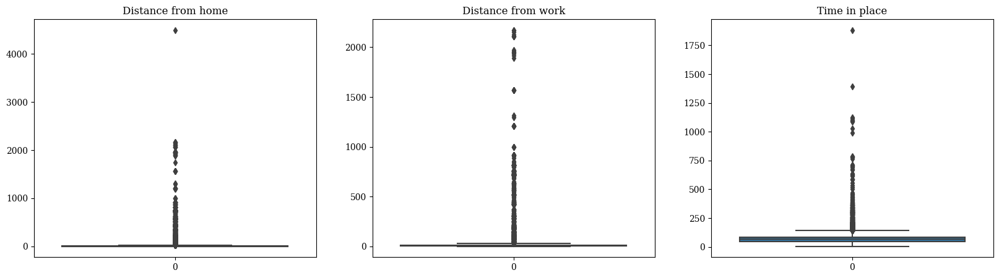

In [8]:
# Box plot of distance_from_home_miles, distance_from_work_miles, time_in_place_minutes
fig, ax = plt.subplots(1, 3, figsize=(20, 5))
sns.boxplot(data['distance_from_home_miles'], ax=ax[0])
sns.boxplot(data['distance_from_work_miles'], ax=ax[1])
sns.boxplot(data['time_in_place_minutes'], ax=ax[2])
ax[0].set_title('Distance from home')
ax[1].set_title('Distance from work')
ax[2].set_title('Time in place')
plt.show()

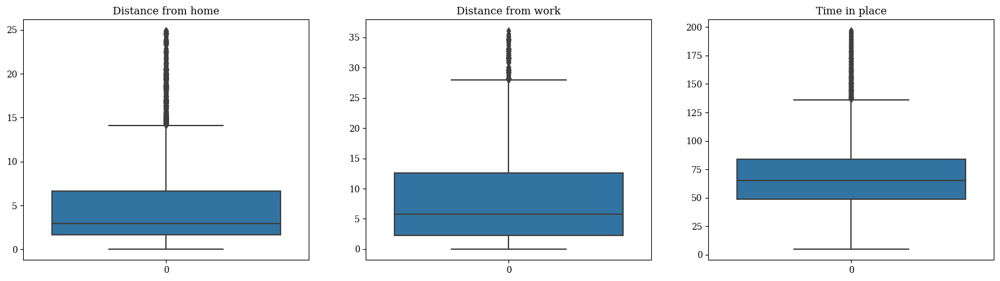

In [9]:
# Removing outliers, using the interquartile range method for the following columns: distance_from_home_miles, distance_from_work_miles, time_in_place_minutes
data = remove_outliers(data, 'distance_from_home_miles', 0.02, 0.80)
data = remove_outliers(data, 'distance_from_work_miles', 0.02, 0.80)
data = remove_outliers(data, 'time_in_place_minutes', 0.02, 0.80)

# Box plot of distance_from_home_miles, distance_from_work_miles, time_in_place_minutes, after removing outliers
fig, ax = plt.subplots(1, 3, figsize=(20, 5))
sns.boxplot(data['distance_from_home_miles'], ax=ax[0])
sns.boxplot(data['distance_from_work_miles'], ax=ax[1])
sns.boxplot(data['time_in_place_minutes'], ax=ax[2])
ax[0].set_title('Distance from home')
ax[1].set_title('Distance from work')
ax[2].set_title('Time in place')
plt.show()

In [10]:
# Saving data
data.to_csv('../output/data.csv', index=False)

print("Shape of data: ", data.shape)
data.head(10)


Shape of data:  (21356, 24)


,device_id,visit_id,visit_start_time,visit_end_time,visit_lat,visit_long,visit_weight,customer_weight,user_home_lat,user_home_long,user_work_lat,user_work_long,place,venue_lat,venue_long,notes,start_date,time_in_place_minutes,day_of_week,weekend,month,visit_hour,distance_from_home_miles,distance_from_work_miles
20610,56da04f0ff02115e0730d497,5a7cd5e2a5a78f05a270cf0a,2018-02-08 17:40:00,2018-02-08 18:05:00,34.084049,-84.539081,20.945921,0.0,34.241127,-84.319103,34.208045,-84.507132,molly,34.083409,-84.538985,well_performing,2018-02-08,25.0,Thursday,0,February,17,16.64,8.80
13530,577dec9fa5a78f62af1fdff0,5a89f990ff02114235fce665,2018-02-18 17:00:00,2018-02-18 17:47:00,34.018486,-84.312263,38.842709,0.0,34.013697,-84.299545,34.023039,-84.287323,holcomb,34.018754,-84.311867,well_performing,2018-02-18,47.0,Sunday,1,February,17,0.79,1.44
13531,577dec9fa5a78f62af1fdff0,5a9b2311ff02116bf91fc0ea,2018-03-03 17:25:00,2018-03-03 18:15:00,34.018684,-84.312218,37.111748,0.0,34.012096,-84.296538,34.021654,-84.287967,holcomb,34.018754,-84.311867,well_performing,2018-03-03,50.0,Saturday,1,March,17,0.99,1.38
13532,577dec9fa5a78f62af1fdff0,5ab041b0c4fff5082921ab1d,2018-03-19 18:54:00,2018-03-19 19:47:00,34.018562,-84.312073,36.568333,0.0,34.012422,-84.296933,34.021243,-84.285257,holcomb,34.018754,-84.311867,well_performing,2018-03-19,53.0,Monday,0,March,18,0.96,1.53
13533,577dec9fa5a78f62af1fdff0,5afa150b196d600836a7e567,2018-05-14 18:48:00,2018-05-14 20:03:00,34.018707,-84.312248,35.220734,0.0,34.014151,-84.297118,34.023214,-84.286283,holcomb,34.018754,-84.311867,well_performing,2018-05-14,75.0,Monday,0,May,18,0.90,1.50
13534,577dec9fa5a78f62af1fdff0,5afc15dfc0af75086cae495c,2018-05-16 07:19:00,2018-05-16 08:09:00,34.018669,-84.312065,34.983936,0.0,34.013898,-84.296366,34.021182,-84.287179,holcomb,34.018754,-84.311867,well_performing,2018-05-16,50.0,Wednesday,0,May,7,0.95,1.42
14442,57f40e58ff02114a342b97fa,5ac43710dbd825085c22e67c,2018-04-03 22:11:00,2018-04-03 23:13:00,34.018433,-84.312126,26.791225,0.0,33.956276,-84.250704,34.051779,-84.286801,holcomb,34.018754,-84.311867,well_performing,2018-04-03,62.0,Tuesday,0,April,22,5.56,2.70
14443,57f40e58ff02114a342b97fa,5ac6c6559f8e760891e60bcc,2018-04-05 20:47:00,2018-04-05 22:13:00,34.018822,-84.311867,26.832918,0.0,33.956920,-84.250852,34.051047,-84.285109,holcomb,34.018754,-84.311867,well_performing,2018-04-05,86.0,Thursday,0,April,20,5.52,2.71
14444,57f40e58ff02114a342b97fa,5acc2c38e6173e0708f9556f,2018-04-09 22:07:00,2018-04-09 22:57:00,34.018745,-84.312141,27.852121,0.0,33.956623,-84.250136,34.050257,-84.285698,holcomb,34.018754,-84.311867,well_performing,2018-04-09,50.0,Monday,0,April,22,5.56,2.64
14445,57f40e58ff02114a342b97fa,5adfdb6c6854140834f552e3,2018-04-24 21:26:00,2018-04-24 22:38:00,34.018682,-84.311493,26.907240,0.0,33.956554,-84.249885,34.050336,-84.285618,holcomb,34.018754,-84.311867,well_performing,2018-04-24,72.0,Tuesday,0,April,21,5.58,2.65


# 3. Analysis


## 3.1. Analysis of visit_weight and customer_weight


### 3.1.1. Analysis at date level


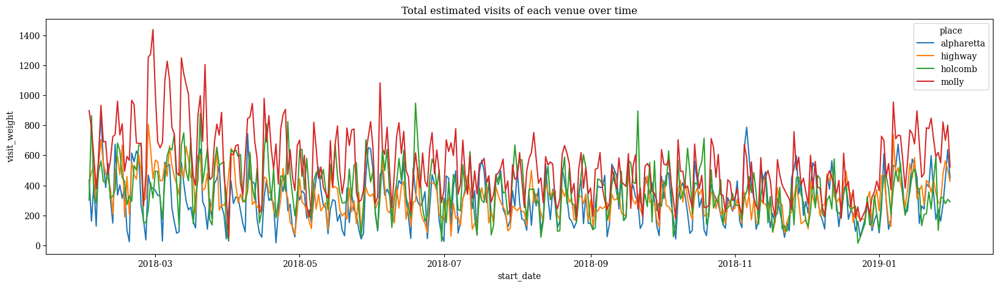

In [11]:
# Group data by venue and date to calculate the total estimated visits

grouped_visits = data.groupby(['place', 'start_date']).agg({
    'visit_weight':
    'sum'
}).reset_index()

# Plot the total estimated visits of each venue over time, using both visit_weight
fig, ax = plt.subplots(figsize=(20, 5))
sns.lineplot(x='start_date',
             y='visit_weight',
             hue='place',
             data=grouped_visits,
             ax=ax)
ax.set_title('Total estimated visits of each venue over time')
plt.show()

The above line plot shows the total estimated visits of each venue over time. Here, we can identify the underperforming venue of alpharetta in comparison to the other venues.


### 3.1.2. Analysis at hour level


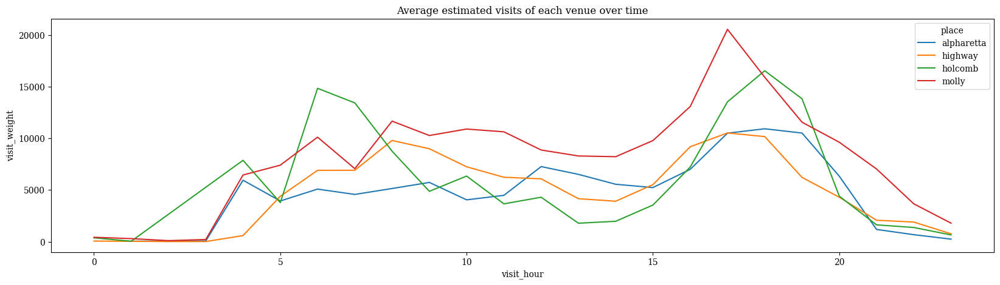

In [12]:
# Group data by venue, day of week and hour to calculate the average estimated visits

grouped_visits = data.groupby(['place', 'visit_hour']).agg({
    'visit_weight':
    'sum'
}).reset_index()

# Plot the average estimated visits of each venue over time, using the visit_weight
fig, ax = plt.subplots(figsize=(20, 5))
sns.lineplot(x='visit_hour',
             y='visit_weight',
             hue='place',
             data=grouped_visits,
             ax=ax)

ax.set_title('Average estimated visits of each venue over time')
plt.show()

In the above line plot, we can see that the customers of Alpharetta gym tend to visit the gym at midday and in the night, while the customers of Holcomb gym (which is the closest gym to Alpharetta gym) tend to visit the gym in the morning and in the night. This could suggest that Alpharetta gym is not offering the right programs or services to attract and retain customers that prefer to visit the gym in the morning.


### 3.1.3. Analysis at day of week level


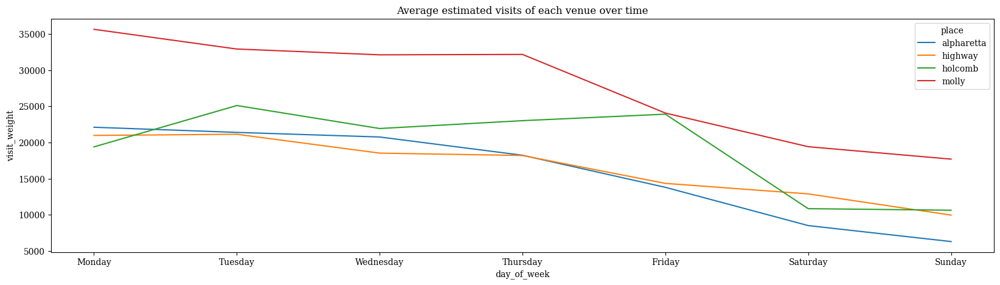

In [13]:
# Plot the average estimated visits of each venue over time, using both the visit_weight and customer_weight, organizing the data by day of the week from Monday to Sunday
categories_order = [
    'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday',
    'Sunday'
]

grouped_visits = data.groupby(['place', 'day_of_week']).agg({
    'visit_weight':
    'sum'
}).reset_index()

grouped_visits['day_of_week'] = pd.Categorical(grouped_visits['day_of_week'],
                                               categories=categories_order,
                                               ordered=True)

fig, ax = plt.subplots(figsize=(20, 5))
sns.lineplot(x='day_of_week',
             y='visit_weight',
             hue='place',
             data=grouped_visits,
             ax=ax)

ax.set_title('Average estimated visits of each venue over time')
plt.show()


From the above figure, we can see a similar trend for the customers of all four gyms for all days of the week, except for the customers of Holcomb gym on Fridays. This could suggest that customers that can choose between Holcomb and Alpharetta gyms tend to prefer Holcomb gym on Fridays, reducing the number of customers of Alpharetta gym on Fridays, which can cause Alpharetta gym to underperform in comparison to the other nearby gyms.


### 3.1.4. Analysis at weekend level


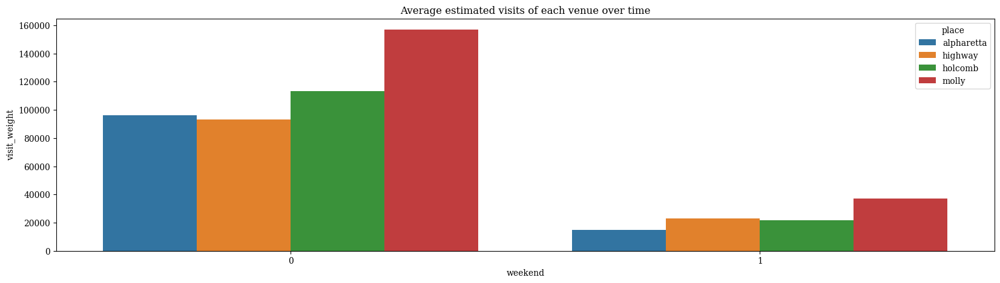

In [14]:
grouped_visits = data.groupby(['place', 'weekend']).agg({
    'visit_weight': 'sum'
}).reset_index()

fig, ax = plt.subplots(figsize=(20, 5))
sns.barplot(x='weekend',
            y='visit_weight',
            hue='place',
            data=grouped_visits,
            ax=ax)

ax.set_title('Average estimated visits of each venue over time')
plt.show()

In the above figure we see a similar behavior for the customers of all four gyms, except for the fact that the customers of Alpharetta gym tend to have a major preference for visiting on weekdays in comparison to customers of Highway gym. However, I can't draw any conclusions from this information, since the number of customers of Alpharetta gym is lower than the other nearby gyms.


### 3.1.5. Analysis at month level


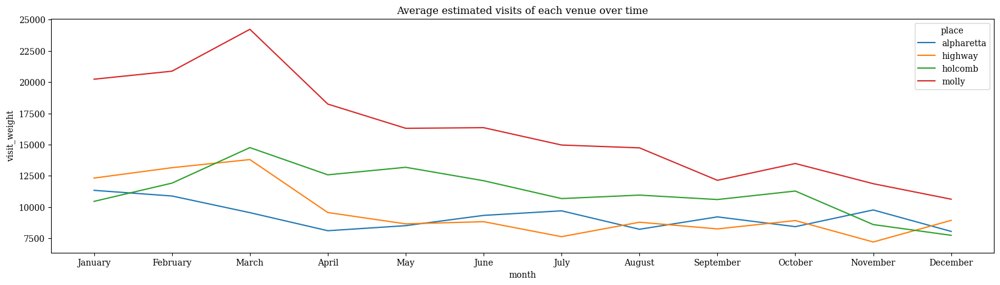

In [15]:
# Plot the average estimated visits of each venue over time, using both the visit_weight and customer_weight, organizing the data by month from January to December

categories_order = [
    'January', 'February', 'March', 'April', 'May', 'June', 'July', 'August',
    'September', 'October', 'November', 'December'
]

grouped_visits = data.groupby(['place', 'month']).agg({
    'visit_weight': 'sum'
}).reset_index()

grouped_visits['month'] = pd.Categorical(grouped_visits['month'],
                                         categories=categories_order,
                                         ordered=True)

fig, ax = plt.subplots(figsize=(20, 5))
sns.lineplot(x='month',
             y='visit_weight',
             hue='place',
             data=grouped_visits,
             ax=ax)

ax.set_title('Average estimated visits of each venue over time')
plt.show()


From the above figure, we can see that the customers of Alpharetta gym underperform in comparison to the other nearby gyms in all months, except for the month of November, which is the month with lower number of estimated visits for all gyms. In addition, Holcomb gym (the closest gym to Alpharetta gym) overperforms in comparison to Alpharetta by a large margin between the months of March and June, probably taking many customers from Alpharetta gym.


### 3.1.6. Analysis at distance from home level


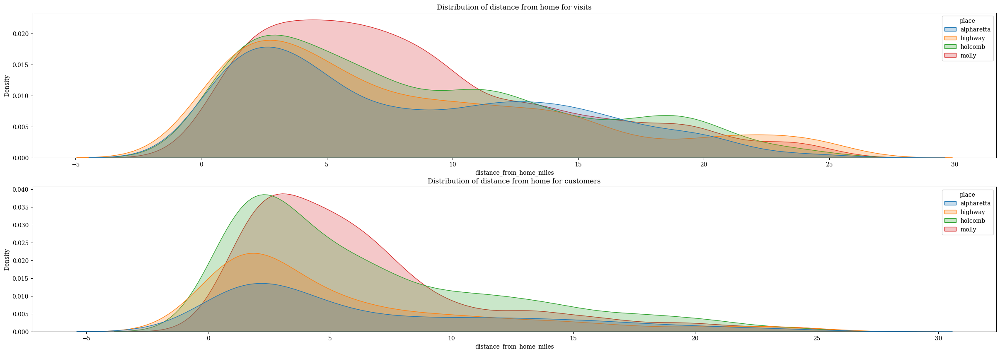

In [16]:
grouped_visits = data.groupby(['place', 'distance_from_home_miles']).agg({
    'visit_weight':
    'sum'
}).reset_index()
grouped_customers = data.groupby(['place', 'device_id']).agg({
    'distance_from_home_miles':
    'mean',
    'customer_weight':
    'first'
}).groupby(['place', 'distance_from_home_miles']).agg({
    'customer_weight': 'sum'
}).reset_index()

fig, ax = plt.subplots(2, 1, figsize=(30, 10))
sns.kdeplot(data=grouped_visits,
            x='distance_from_home_miles',
            hue='place',
            fill=True,
            ax=ax[0])
sns.kdeplot(data=grouped_customers,
            x='distance_from_home_miles',
            hue='place',
            fill=True,
            ax=ax[1])
ax[0].set_title('Distribution of distance from home for visits')
ax[1].set_title('Distribution of distance from home for customers')
plt.show()


The distribution of customers' distance from home to Planet Fitness in Alpharetta is more evenly spread out compared to the distribution of visits. The distribution of visits shows a significant increase for those who live closer to Planet Fitness in Alpharetta, indicating that customers who live in closer proximity to Planet Fitness in in Alpharetta are more likely to attend the gym frequently in comparison to those who live farther away.

This observation is interesting because it suggests that proximity to the gym is a significant factor in the frequency of visits by customers. People who live close to the gym may find it more convenient to attend the gym regularly, while those who live farther away may face more obstacles, such as transportation issues (?), that limit their ability to visit frequently.

Overall, this insight can be valuable for Planet Fitness as it can help them optimize their marketing efforts and target potential customers who live in the nearby areas. Additionally, the gym can also consider offering transportation or other incentives to customers who live farther away (free parking? more parking cells?) to encourage them to visit more frequently.


### 3.1.7. Analysis at distance from work level


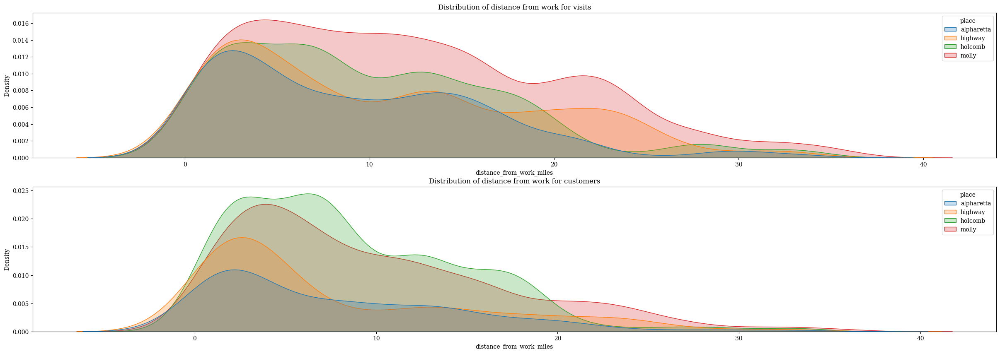

In [17]:
grouped_visits = data.groupby(['place', 'distance_from_work_miles']).agg({
    'visit_weight':
    'sum'
}).reset_index()

grouped_customers = data.groupby(['place', 'device_id']).agg({
    'distance_from_work_miles':
    'mean',
    'customer_weight':
    'first'
}).groupby(['place', 'distance_from_work_miles']).agg({
    'customer_weight': 'sum'
}).reset_index()

fig, ax = plt.subplots(2, 1, figsize=(30, 10))
sns.kdeplot(data=grouped_visits,
            x='distance_from_work_miles',
            hue='place',
            fill=True,
            ax=ax[0])
sns.kdeplot(data=grouped_customers,
            x='distance_from_work_miles',
            hue='place',
            fill=True,
            ax=ax[1])
ax[0].set_title('Distribution of distance from work for visits')
ax[1].set_title('Distribution of distance from work for customers')
plt.show()


Similarly, the distribution of the distance from clients' workplaces to the various Planet Fitness locations is more dispersed than the distribution of visits. Customers are willing to travel further from work to visit a Planet Fitness gym, but the distance for visits is reduced (not spread as far over long distances), as would be expected.

In addition, the graphic reveals an intriguing observation about Molly's Planet Fitness's location. It reveals a high number of visits more than 20 miles from work (and the distance to home graph above revealed a large population with short commutes), implying that the gym is most likely located in a residential area. This observation is significant because it can help Planet Fitness better understand its customer demographics and behavior when it comes to gym visits.


## 3.2. Geo-location analysis of customers


In [18]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21356 entries, 20610 to 15145
Data columns (total 24 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   device_id                 21356 non-null  object 
 1   visit_id                  21356 non-null  object 
 2   visit_start_time          21356 non-null  object 
 3   visit_end_time            21356 non-null  object 
 4   visit_lat                 21356 non-null  float64
 5   visit_long                21356 non-null  float64
 6   visit_weight              21356 non-null  float64
 7   customer_weight           21356 non-null  float64
 8   user_home_lat             21356 non-null  float64
 9   user_home_long            21356 non-null  float64
 10  user_work_lat             21356 non-null  float64
 11  user_work_long            21356 non-null  float64
 12  place                     21356 non-null  object 
 13  venue_lat                 21356 non-null  float64
 14  ve

In [19]:
# Creating a new dataframe: customers. Long and lat
customers = data.groupby(['device_id', 'place']).agg({
    'customer_weight':
    'sum',
    'user_home_lat':
    'mean',
    'user_home_long':
    'mean',
    'user_work_lat':
    'mean',
    'user_work_long':
    'mean',
    'venue_lat':
    'mean',
    'venue_long':
    'mean',
    'distance_from_home_miles':
    'mean',
    'distance_from_work_miles':
    'mean',
    'time_in_place_minutes':
    'mean',
    'visit_hour':
    'mean',
    'weekend': ['sum', 'count'],
    'visit_weight':
    'count'
}).reset_index()

customers.columns = [
    'device_id', 'place', 'customer_weight', 'user_home_lat', 'user_home_long',
    'user_work_lat', 'user_work_long', 'venue_lat', 'venue_long',
    'distance_from_home_miles_mean', 'distance_from_work_miles_mean',
    'time_in_place_minutes', 'visit_hour', 'weekend_sum', 'weekend_count',
    'visit_count'
]

# Round the values
customers = customers.round({
    'user_home_lat': 4,
    'user_home_long': 4,
    'user_work_lat': 4,
    'user_work_long': 4,
    'venue_lat': 4,
    'venue_long': 4,
    'customer_weight': 2,
    'distance_from_home_miles_mean': 2,
    'distance_from_home_miles_max': 2,
    'distance_from_work_miles_mean': 2,
    'distance_from_work_miles_max': 2,
    'time_in_place_minutes': 2,
    'visit_hour': 2,
    'weekend_sum': 2,
    'weekend_count': 2,
    'visit_count': 2
})

customers[
    'pct_weekend'] = customers['weekend_sum'] / customers['weekend_count']
customers['pct_weekend'] = customers['pct_weekend'].fillna(0)

customers = customers.drop(['weekend_sum', 'weekend_count'], axis=1)

# Creating a second dataframe: to count how much places each customer visited
customers_places = data.groupby(['device_id']).agg({
    'place': 'nunique'
}).reset_index()

customers_places.columns = ['device_id', 'places_visits']

# Merge the two dataframes
customers = pd.merge(customers, customers_places, on='device_id')

customers.head()

,device_id,place,customer_weight,user_home_lat,user_home_long,user_work_lat,user_work_long,venue_lat,venue_long,distance_from_home_miles_mean,distance_from_work_miles_mean,time_in_place_minutes,visit_hour,visit_count,pct_weekend,places_visits
0,56da04f0ff02115e0730d497,molly,0.0,34.2411,-84.3191,34.2080,-84.5071,34.0834,-84.5390,16.64,8.80,25.00,17.00,1,0.0,1
1,577dec9fa5a78f62af1fdff0,holcomb,0.0,34.0133,-84.2973,34.0221,-84.2868,34.0188,-84.3119,0.92,1.45,55.00,15.40,5,0.4,1
2,57f40e58ff02114a342b97fa,holcomb,0.0,33.9567,-84.2506,34.0508,-84.2857,34.0188,-84.3119,5.54,2.68,64.33,21.17,6,0.0,1
3,57f43412a5a78f28074389e8,molly,0.0,34.0880,-84.4617,33.6604,-84.5130,34.0834,-84.5390,4.44,29.27,56.33,15.20,15,0.2,1
4,57f45210a5a78f31394389e6,alpharetta,0.0,33.8712,-84.5911,34.0400,-84.3425,34.0425,-84.3422,18.54,0.17,45.67,11.00,3,0.0,1


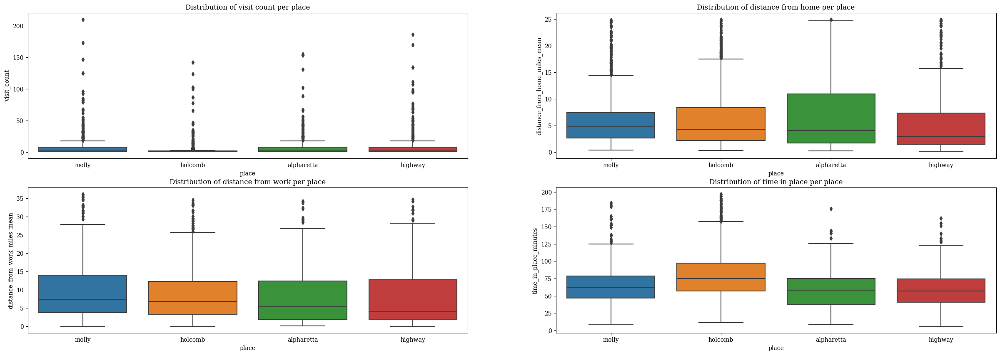

In [20]:
# bosxplot visit_count per place, distance_from_home_miles_mean, distance_from_work_miles_mean, time_in_place_minutes
fig, ax = plt.subplots(2, 2, figsize=(30, 10))
sns.boxplot(data=customers, x='place', y='visit_count', ax=ax[0, 0])
sns.boxplot(data=customers,
            x='place',
            y='distance_from_home_miles_mean',
            ax=ax[0, 1])
sns.boxplot(data=customers,
            x='place',
            y='distance_from_work_miles_mean',
            ax=ax[1, 0])
sns.boxplot(data=customers, x='place', y='time_in_place_minutes', ax=ax[1, 1])
ax[0, 0].set_title('Distribution of visit count per place')
ax[0, 1].set_title('Distribution of distance from home per place')
ax[1, 0].set_title('Distribution of distance from work per place')
ax[1, 1].set_title('Distribution of time in place per place')
plt.show()

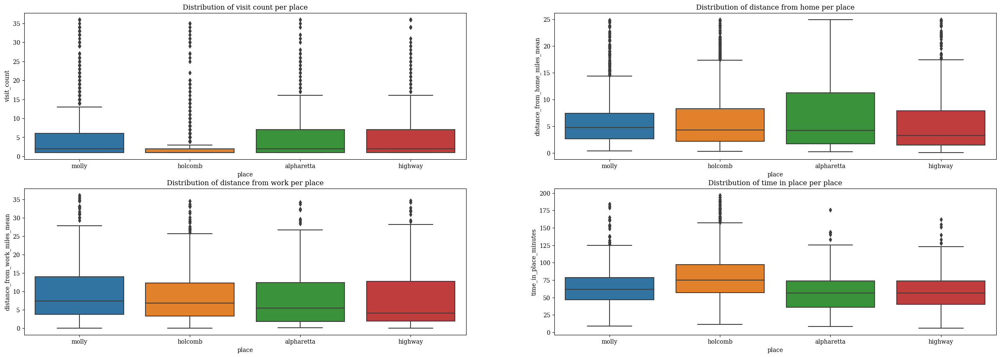

In [21]:
# Removing outliers of visit_count
customers = remove_outliers(customers, 'visit_count', 0.00, 0.90)

# Box plot of visit_count per place, distance_from_home_miles_mean, distance_from_work_miles_mean, time_in_place_minutes after removing outliers
fig, ax = plt.subplots(2, 2, figsize=(30, 10))
sns.boxplot(data=customers, x='place', y='visit_count', ax=ax[0, 0])
sns.boxplot(data=customers,
            x='place',
            y='distance_from_home_miles_mean',
            ax=ax[0, 1])
sns.boxplot(data=customers,
            x='place',
            y='distance_from_work_miles_mean',
            ax=ax[1, 0])
sns.boxplot(data=customers, x='place', y='time_in_place_minutes', ax=ax[1, 1])
ax[0, 0].set_title('Distribution of visit count per place')
ax[0, 1].set_title('Distribution of distance from home per place')
ax[1, 0].set_title('Distribution of distance from work per place')
ax[1, 1].set_title('Distribution of time in place per place')
plt.show()

In [22]:
# Saving cutomers dataframe
customers.to_csv('../output/customers.csv', index=False)

In [23]:
# Dataframe with information about percentiles of visit_count per place
customers.groupby('place')['visit_count'].describe(
    percentiles=[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])


,count,mean,std,min,10%,20%,30%,40%,50%,60%,70%,80%,90%,100%,max
place,,,,,,,,,,,,,,,
alpharetta,401.0,5.229426,7.059195,1.0,1.0,1.0,1.0,1.0,2.0,3.0,5.0,8.0,16.0,36.0,36.0
highway,550.0,5.180000,6.679929,1.0,1.0,1.0,1.0,1.0,2.0,3.0,5.3,9.0,13.0,36.0,36.0
holcomb,1297.0,2.444873,4.104190,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,3.0,4.0,35.0,35.0
molly,1032.0,5.520349,7.165737,1.0,1.0,1.0,1.0,2.0,2.0,4.0,5.0,8.0,16.0,36.0,36.0


In [24]:
# Create a map
m = folium.Map(location=[data['venue_lat'].mean(), data['venue_long'].mean()],
               zoom_start=14,
               tiles='openstreetmap')

# Add a different color to place = 'alpharetta'
for i, place in enumerate(data['place'].unique()):
    if place == 'alpharetta':
        color = 'red'
    else:
        color = 'blue'
    data_place = data[data['place'] == place]

    # Add a marker for each place
    folium.Marker(
        location=[
            data_place['venue_lat'].mean(), data_place['venue_long'].mean()
        ],
        popup=place,
        icon=folium.Icon(color=color, icon='info-sign'),
    ).add_to(m)

    # Including a legend for Alpharetta
    legend_html = '''
    <div style='position: fixed;
                bottom: 50px; left: 50px; width: 150px; height: 70px;
                border:2px solid grey; z-index:9999; font-size:14px;
                '>&nbsp; Underperforming &nbsp; <i class='fa fa-map-marker fa-2x' style='color:red'></i><br>
                &nbsp; Well_performing &nbsp; <i class='fa fa-map-marker fa-2x' style='color:blue'></i>
    </div>
    '''
    m.get_root().html.add_child(folium.Element(legend_html))

# Display the map with the necessary zoom
m.fit_bounds(m.get_bounds())
m


In [25]:
customers_alpharetta = customers[customers['place'] == 'alpharetta']
customers_highway = customers[customers['place'] == 'highway']
customers_holcomb = customers[customers['place'] == 'holcomb']
customers_molly = customers[customers['place'] == 'molly']


In [26]:
customers_alpharetta.head()

,device_id,place,customer_weight,user_home_lat,user_home_long,user_work_lat,user_work_long,venue_lat,venue_long,distance_from_home_miles_mean,distance_from_work_miles_mean,time_in_place_minutes,visit_hour,visit_count,pct_weekend,places_visits
4,57f45210a5a78f31394389e6,alpharetta,0.0,33.8712,-84.5911,34.0400,-84.3425,34.0425,-84.3422,18.54,0.17,45.67,11.00,3,0.000000,1
14,57fc6e49a5a78f75c179c1f4,alpharetta,0.0,34.0766,-84.6374,34.0365,-84.2908,34.0425,-84.3422,17.07,2.97,58.00,10.00,1,0.000000,2
21,57fec84d397c7753c94d3287,alpharetta,0.0,34.0660,-84.2083,34.0679,-84.0993,34.0425,-84.3422,7.84,14.02,12.00,11.00,1,1.000000,1
26,5800b29ba5a78f6e5079c1fc,alpharetta,0.0,34.0049,-84.4782,34.0673,-84.3193,34.0425,-84.3422,8.21,2.16,46.91,8.83,23,0.000000,1
30,5801a939ff021148e8ad322a,alpharetta,0.0,34.0053,-84.3404,34.0056,-84.2907,34.0425,-84.3422,2.58,3.89,102.00,13.33,3,0.333333,1


### 3.2.1. Alpharetta


In [27]:
# Create a map with lines between the venues using [user_home_lat, user_home_long] and [user_work_lat, user_work_long]
m = folium.Map(
    location=[
        customers['venue_lat'].mean(),
        customers['venue_long'].mean(),
    ],
    zoom_start=10,
    tiles='openstreetmap',
)

# Alpharetta
for _, row in customers_alpharetta.iterrows():
    folium.CircleMarker(
        [row['venue_lat'], row['venue_long']],
        radius=20,
        fill_color='black',
    ).add_to(m)

    folium.CircleMarker(
        [row['user_home_lat'], row['user_home_long']],
        radius=10,
        fill_color='blue',
    ).add_to(m)

    folium.PolyLine([[row['user_home_lat'], row['user_home_long']],
                     [row['user_work_lat'], row['user_work_long']]],
                    color='blue').add_to(m)

# Display the map
m

### 3.2.2. Highway


In [28]:
# Create a map with lines between the venues using [user_home_lat, user_home_long] and [user_work_lat, user_work_long]
m = folium.Map(
    location=[
        customers['venue_lat'].mean(),
        customers['venue_long'].mean(),
    ],
    zoom_start=10,
    tiles='openstreetmap',
)

# Highway
for _, row in customers_highway.iterrows():
    folium.CircleMarker(
        [row['venue_lat'], row['venue_long']],
        radius=20,
        fill_color='black',
    ).add_to(m)

    folium.CircleMarker(
        [row['user_home_lat'], row['user_home_long']],
        radius=10,
        fill_color='orange',
    ).add_to(m)

    folium.PolyLine([[row['user_home_lat'], row['user_home_long']],
                     [row['user_work_lat'], row['user_work_long']]],
                    color='orange').add_to(m)

# Display the map
m

### 3.2.3. Holcomb


In [29]:
# Create a map with lines between the venues using [user_home_lat, user_home_long] and [user_work_lat, user_work_long]
m = folium.Map(
    location=[
        customers['venue_lat'].mean(),
        customers['venue_long'].mean(),
    ],
    zoom_start=10,
    tiles='openstreetmap',
)

# Holcomb
for _, row in customers_holcomb.iterrows():
    folium.CircleMarker(
        [row['venue_lat'], row['venue_long']],
        radius=20,
        fill_color='black',
    ).add_to(m)

    folium.CircleMarker(
        [row['user_home_lat'], row['user_home_long']],
        radius=10,
        fill_color='green',
    ).add_to(m)

    folium.PolyLine([[row['user_home_lat'], row['user_home_long']],
                     [row['user_work_lat'], row['user_work_long']]],
                    color='green').add_to(m)

# Display the map
m

### 3.2.4. Molly


In [30]:
# Create a map with lines between the venues using [user_home_lat, user_home_long] and [user_work_lat, user_work_long]
m = folium.Map(
    location=[
        customers['venue_lat'].mean(),
        customers['venue_long'].mean(),
    ],
    zoom_start=10,
    tiles='openstreetmap',
)

# Molly
for _, row in customers_molly.iterrows():
    folium.CircleMarker(
        [row['venue_lat'], row['venue_long']],
        radius=20,
        fill_color='black',
    ).add_to(m)

    folium.CircleMarker(
        [row['user_home_lat'], row['user_home_long']],
        radius=10,
        fill_color='red',
    ).add_to(m)

    folium.PolyLine([[row['user_home_lat'], row['user_home_long']],
                     [row['user_work_lat'], row['user_work_long']]],
                    color='red').add_to(m)

# Display the map
m

In [31]:
# Create a map with lines between the venues using [user_home_lat, user_home_long] and [user_work_lat, user_work_long]
m = folium.Map(
    location=[
        customers['venue_lat'].mean(),
        customers['venue_long'].mean(),
    ],
    zoom_start=10,
    tiles='openstreetmap',
)

# Molly
for _, row in customers_molly.iterrows():
    folium.CircleMarker(
        [row['user_home_lat'], row['user_home_long']],
        radius=10,
        fill_color='red',
    ).add_to(m)

    folium.PolyLine([[row['user_home_lat'], row['user_home_long']],
                     [row['user_work_lat'], row['user_work_long']]],
                    color='red').add_to(m)

# Highway
for _, row in customers_highway.iterrows():
    folium.CircleMarker(
        [row['user_home_lat'], row['user_home_long']],
        radius=10,
        fill_color='orange',
    ).add_to(m)

    folium.PolyLine([[row['user_home_lat'], row['user_home_long']],
                     [row['user_work_lat'], row['user_work_long']]],
                    color='orange').add_to(m)

# Holcomb
for _, row in customers_holcomb.iterrows():
    folium.CircleMarker(
        [row['user_home_lat'], row['user_home_long']],
        radius=10,
        fill_color='green',
    ).add_to(m)

    folium.PolyLine([[row['user_home_lat'], row['user_home_long']],
                     [row['user_work_lat'], row['user_work_long']]],
                    color='green').add_to(m)

# Alpharetta
for _, row in customers_alpharetta.iterrows():
    folium.CircleMarker(
        [row['user_home_lat'], row['user_home_long']],
        radius=10,
        fill_color='blue',
    ).add_to(m)

    folium.PolyLine([[row['user_home_lat'], row['user_home_long']],
                     [row['user_work_lat'], row['user_work_long']]],
                    color='blue').add_to(m)

# Add a different color to place = 'alpharetta'
color_dict = {
    'alpharetta': 'blue',
    'highway': 'orange',
    'holcomb': 'green',
    'molly': 'red'
}

# Add a marker for each place with the corresponding color
for place in data['place'].unique():
    color = color_dict.get(place, 'black')
    data_place = data[data['place'] == place]
    folium.Marker(
        location=[
            data_place['venue_lat'].mean(), data_place['venue_long'].mean()
        ],
        popup=place,
        icon=folium.Icon(color=color, icon='info-sign'),
    ).add_to(m)

# Display the map
m

In the previous maps, we can see that Holcomb and Alpharetta are located in the same area.

This could suggest that the customers of Holcomb and Alpharetta are similar in terms of their distance from home and work. Therefore, one possible explanation of the underperformance of Alpharetta is that the customers of Alpharetta are similar to the customers of Holcomb. This could explain why the total estimated visits and customers of Alpharetta is lower than the other venues.


# 4. Clustering analysis


## 4.1. Preparing datasets


In [32]:
customers.head()

,device_id,place,customer_weight,user_home_lat,user_home_long,user_work_lat,user_work_long,venue_lat,venue_long,distance_from_home_miles_mean,distance_from_work_miles_mean,time_in_place_minutes,visit_hour,visit_count,pct_weekend,places_visits
0,56da04f0ff02115e0730d497,molly,0.0,34.2411,-84.3191,34.2080,-84.5071,34.0834,-84.5390,16.64,8.80,25.00,17.00,1,0.0,1
1,577dec9fa5a78f62af1fdff0,holcomb,0.0,34.0133,-84.2973,34.0221,-84.2868,34.0188,-84.3119,0.92,1.45,55.00,15.40,5,0.4,1
2,57f40e58ff02114a342b97fa,holcomb,0.0,33.9567,-84.2506,34.0508,-84.2857,34.0188,-84.3119,5.54,2.68,64.33,21.17,6,0.0,1
3,57f43412a5a78f28074389e8,molly,0.0,34.0880,-84.4617,33.6604,-84.5130,34.0834,-84.5390,4.44,29.27,56.33,15.20,15,0.2,1
4,57f45210a5a78f31394389e6,alpharetta,0.0,33.8712,-84.5911,34.0400,-84.3425,34.0425,-84.3422,18.54,0.17,45.67,11.00,3,0.0,1


In [33]:
customers.describe(include='all')

,device_id,place,customer_weight,user_home_lat,user_home_long,user_work_lat,user_work_long,venue_lat,venue_long,distance_from_home_miles_mean,distance_from_work_miles_mean,time_in_place_minutes,visit_hour,visit_count,pct_weekend,places_visits
count,3280,3280,3280.000000,3280.000000,3280.000000,3280.000000,3280.000000,3280.000000,3280.000000,3280.000000,3280.000000,3280.000000,3280.000000,3280.000000,3280.000000,3280.000000
unique,3149,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,59b45175ff02116e66c2247f,holcomb,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,4,1297,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,85.717506,34.064146,-84.379037,34.014255,-84.367273,34.055873,-84.379814,6.084412,8.486994,68.353399,15.028018,4.211585,0.225653,1.091159
std,NaN,NaN,520.942680,0.093234,0.151736,0.122394,0.139535,0.033936,0.109743,5.375467,6.937366,30.808169,3.900064,6.197599,0.359458,0.332147
min,NaN,NaN,0.000000,33.671300,-84.947000,33.567900,-85.080900,34.018800,-84.539000,0.060000,0.060000,6.000000,0.000000,1.000000,0.000000,1.000000
25%,NaN,NaN,0.000000,34.011500,-84.508400,33.932100,-84.467400,34.018800,-84.539000,2.170000,2.897500,47.595000,12.000000,1.000000,0.000000,1.000000
50%,NaN,NaN,0.000000,34.067500,-84.344400,34.037750,-84.350250,34.042500,-84.311900,4.315000,6.530000,65.000000,16.000000,1.000000,0.000000,1.000000
75%,NaN,NaN,39.645000,34.115225,-84.275100,34.088325,-84.278900,34.083400,-84.311900,8.172500,12.680000,84.000000,18.000000,4.000000,0.333333,1.000000


In [34]:
# Analyzing different customers and clustering them based on their behavior
customers_behavior = customers.copy()
customers_behavior = customers_behavior.drop(
    [
        'user_home_lat', 'user_home_long', 'user_work_lat', 'user_work_long',
        'venue_lat', 'venue_long'
    ],
    axis=1,
)

display(customers_behavior.info())
customers_behavior.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3280 entries, 0 to 3386
Data columns (total 10 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   device_id                      3280 non-null   object 
 1   place                          3280 non-null   object 
 2   customer_weight                3280 non-null   float64
 3   distance_from_home_miles_mean  3280 non-null   float64
 4   distance_from_work_miles_mean  3280 non-null   float64
 5   time_in_place_minutes          3280 non-null   float64
 6   visit_hour                     3280 non-null   float64
 7   visit_count                    3280 non-null   int64  
 8   pct_weekend                    3280 non-null   float64
 9   places_visits                  3280 non-null   int64  
dtypes: float64(6), int64(2), object(2)
memory usage: 281.9+ KB


None

,device_id,place,customer_weight,distance_from_home_miles_mean,distance_from_work_miles_mean,time_in_place_minutes,visit_hour,visit_count,pct_weekend,places_visits
0,56da04f0ff02115e0730d497,molly,0.0,16.64,8.80,25.00,17.00,1,0.0,1
1,577dec9fa5a78f62af1fdff0,holcomb,0.0,0.92,1.45,55.00,15.40,5,0.4,1
2,57f40e58ff02114a342b97fa,holcomb,0.0,5.54,2.68,64.33,21.17,6,0.0,1
3,57f43412a5a78f28074389e8,molly,0.0,4.44,29.27,56.33,15.20,15,0.2,1
4,57f45210a5a78f31394389e6,alpharetta,0.0,18.54,0.17,45.67,11.00,3,0.0,1


In [35]:
# Creating 4 datasets, each per place
customers_behavior_alpharetta = customers_behavior[
    customers_behavior['place'] == 'alpharetta'].drop(
        ['device_id', 'place'], axis=1).reset_index(drop=True)
customers_behavior_highway = customers_behavior[
    customers_behavior['place'] == 'highway'].drop(
        ['device_id', 'place'], axis=1).reset_index(drop=True)
customers_behavior_holcomb = customers_behavior[
    customers_behavior['place'] == 'holcomb'].drop(
        ['device_id', 'place'], axis=1).reset_index(drop=True)
customers_behavior_molly = customers_behavior[
    customers_behavior['place'] == 'molly'].drop(['device_id', 'place'],
                                                 axis=1).reset_index(drop=True)


In [36]:
customers_behavior_alpharetta.head()

,customer_weight,distance_from_home_miles_mean,distance_from_work_miles_mean,time_in_place_minutes,visit_hour,visit_count,pct_weekend,places_visits
0,0.0,18.54,0.17,45.67,11.00,3,0.000000,1
1,0.0,17.07,2.97,58.00,10.00,1,0.000000,2
2,0.0,7.84,14.02,12.00,11.00,1,1.000000,1
3,0.0,8.21,2.16,46.91,8.83,23,0.000000,1
4,0.0,2.58,3.89,102.00,13.33,3,0.333333,1


## 4.2. Clustering customers per place


### 4.2.1. Alpharetta


Text(0, 0.5, 'SSE - Sum of Squared Euclidean distances to centroid')

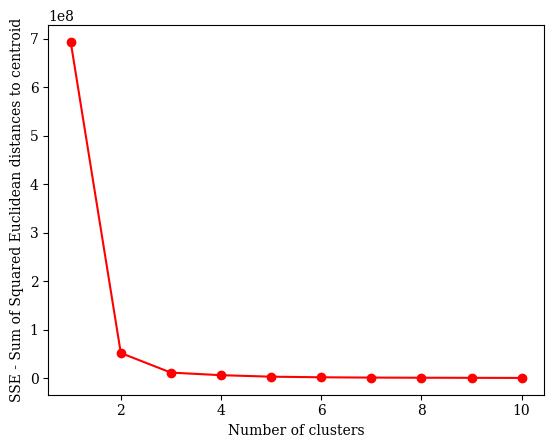

In [37]:
# Using the elbow method to find the optimal number of clusters
DATASET = customers_behavior_alpharetta
sse = optimal_clusters_sse(DATASET, 10, 0.002)

plt.figure()
plt.plot(list(sse.keys()), list(sse.values()), marker='o', color='red')
plt.xlabel("Number of clusters")
plt.ylabel("SSE - Sum of Squared Euclidean distances to centroid")

In [38]:
# Showing the common values for each cluster

customer_types_alpharetta = get_customer_types(
    customers_behavior_alpharetta,
    3,
)
customer_types_alpharetta

,customer_weight,distance_from_home_miles_mean,distance_from_work_miles_mean,time_in_place_minutes,visit_hour,visit_count,pct_weekend,places_visits,label,customer_pct
0,1828.157692,3.746923,8.163077,62.523077,14.576154,22.307692,0.136062,1.384615,customer_type_1,3.2
1,35.249638,6.875401,7.718760,55.875736,13.996227,4.581395,0.185051,1.258398,customer_type_2,96.5
2,25458.160000,19.980000,1.750000,86.440000,18.760000,34.000000,0.029412,1.000000,customer_type_3,0.2


Based on the values of their features, the customer types can be labeled as follows:

- Customer type 1: These customers have a short distance from home and a moderate distance from work to the gym, spend a moderate amount of time in the gym, and visit during the afternoons. They tend to visit other nearby gyms sometimes, have a slight preference for visiting on weekends, and they go too often to the gym. **The 3.2% of the customers of alpharetta belong to this type and their customer weight is low**.

- Customer type 2: These customers have a moderate distance from both home and work to the gym, spend a moderate amount of time in the gym, and visit during the afternoons. They tend to visit other nearby gyms, have a slight preference for visiting on weekends, and they rarely go to the gym. **The 96.5% of the customers of alpharetta belong to this type and their customer weight is too low**.

- Customer type 3: These customers have a long distance from home and a short distance from work to the gym, spend more time in the gym, and visit the gym at night. They **do not** tend to visit other nearby gyms, **do not** tend to visit the gyms on weekends and they go too often to the gym. **Only the 0.2% of the customers of alpharetta belong to this type and their customer weight is very high**.


### 4.2.2. Highway


Text(0, 0.5, 'SSE - Sum of Squared Euclidean distances to centroid')

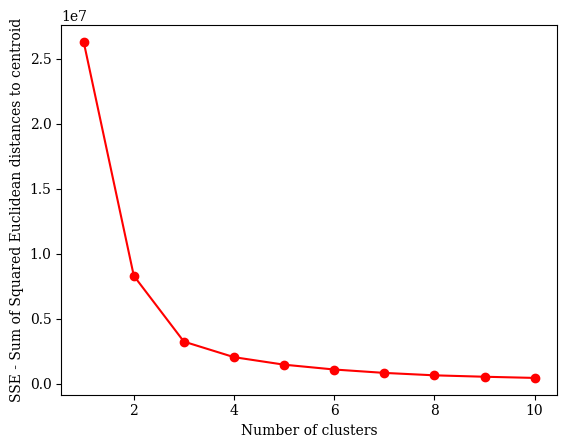

In [39]:
# Using the elbow method to find the optimal number of clusters
DATASET = customers_behavior_highway
sse = optimal_clusters_sse(DATASET, 10, 0.002)

plt.figure()
plt.plot(list(sse.keys()), list(sse.values()), marker='o', color='red')
plt.xlabel("Number of clusters")
plt.ylabel("SSE - Sum of Squared Euclidean distances to centroid")

In [40]:
# Showing the common values for each cluster

customer_types_highway = get_customer_types(
    customers_behavior_highway,
    4,
)

customer_types_highway

,customer_weight,distance_from_home_miles_mean,distance_from_work_miles_mean,time_in_place_minutes,visit_hour,visit_count,pct_weekend,places_visits,label,customer_pct
0,9.123472,5.540972,7.646865,56.947817,14.228472,4.732143,0.249867,1.109127,customer_type_1,91.6
1,744.032857,5.326429,6.210000,69.306429,14.256429,13.214286,0.153229,1.357143,customer_type_2,2.5
2,1773.738000,5.178000,6.508000,67.288000,14.450000,27.600000,0.085276,1.200000,customer_type_3,0.9
3,312.280370,5.990000,10.161481,66.811481,14.475926,5.222222,0.191887,1.111111,customer_type_4,4.9


Based on the values of their features, the customer types can be labeled as follows:

- Customer type 1: These customers have a moderate distance from both home and work to the gym, spend a moderate amount of time in the gym, and visit during the first hours of the afternoon. They **do not** tend to visit other nearby gyms and have a **high** preference for visiting on weekends and they do not go too often to the gym. **The 91.6% of the customers of highway belong to this type and their customer weight is too low**.

- Customer type 2: These customers have a moderate distance from both home and work to the gym, spend a high amount of time in the gym, and visit during the first hours of the afternoon. They tend to visit other nearby gyms, have a slight preference for visiting on weekends and they moderately often go to the gym. **The 2.5% of the customers of highway belong to this type and their customer weight is low-moderate**.

- Customer type 3: These customers have a moderate distance from both home and work to the gym, spend a high amount of time in the gym, and visit during the first hours of the afternoon. They do not tend to visit other nearby gyms, they do not visit the gym on weekends and they moderately often go to the gym. **The 0.9% of the customers of highway belong to this type and their customer weight is low-moderate**.

- Customer type 4: These customers have a moderate distance from home and a long distance from work to the gym, spend a high amount of time in the gym, and visit during the first hours of the afternoon. They do not tend to visit other nearby gyms, have a slight preference for visiting on weekends and they do not go too often to the gym. **The 4.9% of the customers of highway belong to this type and their customer weight is low**.


### 4.2.3. Holcomb


Text(0, 0.5, 'SSE - Sum of Squared Euclidean distances to centroid')

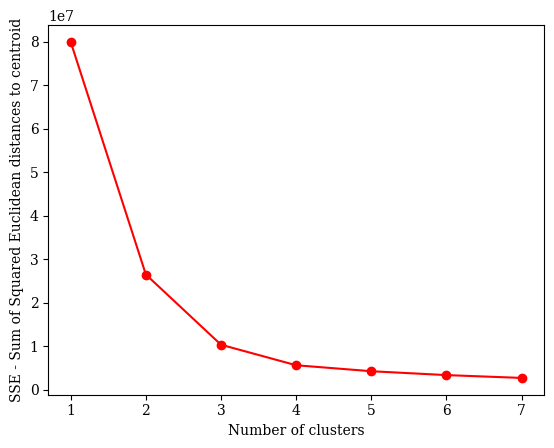

In [41]:
# Using the elbow method to find the optimal number of clusters
DATASET = customers_behavior_holcomb
sse = optimal_clusters_sse(DATASET, 10, 0.002)

plt.figure()
plt.plot(list(sse.keys()), list(sse.values()), marker='o', color='red')
plt.xlabel("Number of clusters")
plt.ylabel("SSE - Sum of Squared Euclidean distances to centroid")

In [42]:
# Showing the common values for each cluster

customer_types_holcomb = get_customer_types(
    customers_behavior_holcomb,
    4,
)

customer_types_holcomb

,customer_weight,distance_from_home_miles_mean,distance_from_work_miles_mean,time_in_place_minutes,visit_hour,visit_count,pct_weekend,places_visits,label,customer_pct
0,13.005242,6.320494,8.331272,80.296057,15.848756,2.205855,0.232664,1.059469,customer_type_1,84.3
1,3045.351667,4.973333,5.550000,54.071667,10.923333,26.500000,0.114996,1.166667,customer_type_2,0.5
2,843.634167,2.702917,7.299583,74.886250,15.182917,8.833333,0.169263,1.125000,customer_type_3,1.9
3,206.436092,5.070460,7.835632,79.662356,16.022701,2.235632,0.252593,1.040230,customer_type_4,13.4


Based on the values of their features, the customer types can be labeled as follows:

- Customer type 1: These customers have a moderate distance from both home and work to the gym, spend a high amount of time in the gym, and visit during the afternoons. They **do not** tend to visit other nearby gyms, have a **high** preference for visiting on weekends and they do not go too often to the gym. **The 84.3% of the customers of holcomb belong to this type and their customer weight is too low**.

- Customer type 2: These customers have a short distance from home and a moderate distance from work to the gym, spend a moderate amount of time in the gym, and visit during the mornings. They **do not** tend to visit other nearby gyms, have a slight preference for visiting on weekends and they often go to the gym. **The 0.5% of the customers of holcom belong to this type and their customer weight is moderate**.

- Customer type 3: These customers have a short distance from home and a moderate distance from work to the gym, spend a high amount of time in the gym, and visit during the afternoons. They **do not** tend to visit other nearby gyms, have a slight preference for visiting on weekends and they ocasionally go to the gym. **The 1.9% of the customers of holcom belong to this type and their customer weight is low-moderate**.

- Customer type 4: These customers have a moderate distance from both home and work to the gym, spend a high amount of time in the gym, and visit during the afternoons. They **do not** tend to visit other nearby gyms, have a **high** preference for visiting on weekends and they do not go too often to the gym. **The 13.4% of the customers of holcom belong to this type and their customer weight is low-moderate**.


### 4.2.4. Molly


Text(0, 0.5, 'SSE - Sum of Squared Euclidean distances to centroid')

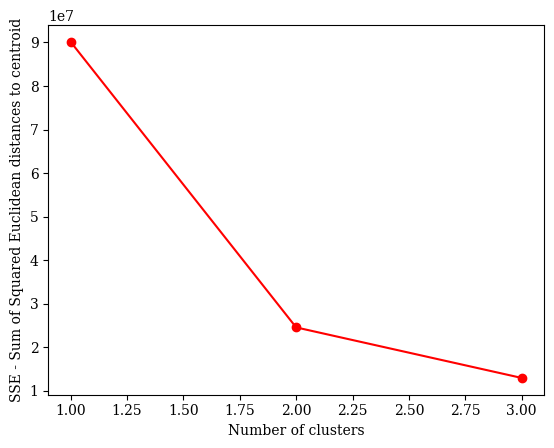

In [43]:
# Using the elbow method to find the optimal number of clusters
DATASET = customers_behavior_molly
sse = optimal_clusters_sse(DATASET, 10, 0.002)

plt.figure()
plt.plot(list(sse.keys()), list(sse.values()), marker='o', color='red')
plt.xlabel("Number of clusters")
plt.ylabel("SSE - Sum of Squared Euclidean distances to centroid")


In [44]:
# Showing the common values for each cluster

customer_types_molly = get_customer_types(
    customers_behavior_molly,
    2,
)

customer_types_molly

,customer_weight,distance_from_home_miles_mean,distance_from_work_miles_mean,time_in_place_minutes,visit_hour,visit_count,pct_weekend,places_visits,label,customer_pct
0,32.238602,6.178828,9.609311,64.066269,14.834779,4.901336,0.225964,1.050360,customer_type_1,94.3
1,1117.805932,4.665932,7.908814,64.078644,14.550169,15.728814,0.172443,1.084746,customer_type_2,5.7


Based on the values of their features, the customer types can be labeled as follows:

- Customer type 1: These customers have a moderate distance from both home and work to the gym, spend a moderate amount of time in the gym, and visit during the afternoons. They do not tend to visit other nearby gyms, they tend to visit the gym on weekends and they do not go too often to the gym. **The 94.3% of the customers of alpharetta belong to this type and their customer weight is too low**.

- Customer type 2: These customers have a short distance from home and a moderate distance from work to the gym, spend a moderate amount of time in the gym, and visit during the afternoons. They do not tend to visit other nearby gyms, have a slight preference for visiting on weekends and they moderately often go to the gym. **The 5.7% of the customers of alpharetta belong to this type and their customer weight is low-moderate**.


# 5. Conclusions


Based on the given information about the different types of customers for Alpharetta, Holcomb, and Highway, we can identify several factors that may contribute to Alpharetta gym's underperformance in comparison to the other two nearby gyms:

- Customer preferences on weekends: Alpharetta gym's customers tend to have a slight preference for visiting on weekends, while Holcomb gym's customers have a high preference for visiting on weekends. Highway gym's customers also have a high preference for visiting on weekends. This may suggest that Alpharetta gym is not offering the right programs or services to attract and retain customers that prefer to visit the gym on weekends.

- Competition: Alpharetta gym's customers tend to visit other nearby gyms sometimes, while Holcomb and Highway gyms' customers do not tend to visit other nearby gyms that much. It is important to note that only the four Planet Fitness gyms in the area are considered as nearby gyms, as there is no more information about other gyms in the area.
  This may indicate that Alpharetta gym faces stronger competition in the area, which could impact its ability to attract and retain customers.

Taken together, these factors suggest that the Alpharetta gym may need to adjust its approach to better meet the needs and preferences of its customers, and to better compete with nearby gyms.
This could involve changes to its offerings, pricing, marketing, or other factors that affect the customer experience.
